# Pomagranate Growth Analysis


## Overview



 We'll training some of the  object detection model to recognize the Pomagranate Growth: bud,flower, early-fruit, mid-growth, ripe.



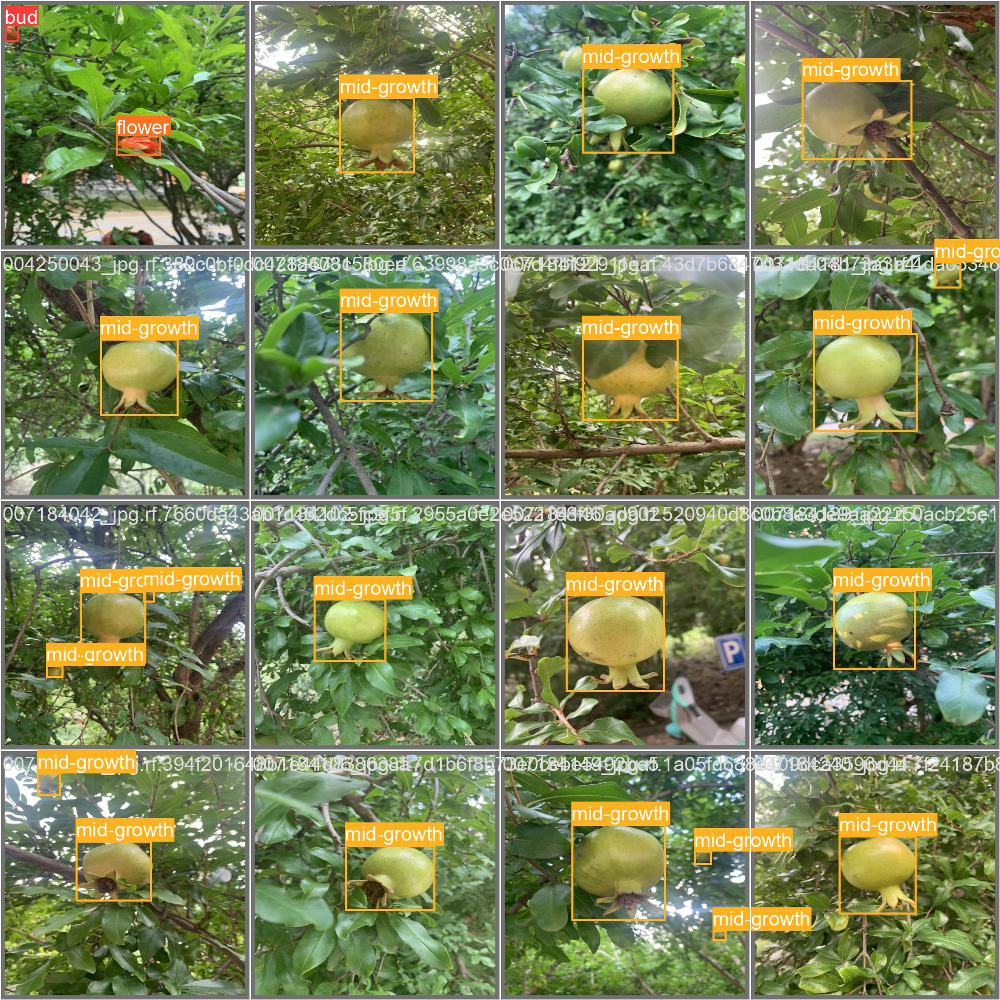



### **Our Data**

The dataset consists of images capturing various growth stages of pomegranates. The images were collected from May to September in an orchard located within the Henan Institute of Science and Technology in China. There are a total of 5857 images in the dataset, and each image is labeled and classified into one of five periods: bud, flower, early-fruit, mid-growth, and ripe.
The dataset was curated and hosted by the School of Computer Science and Technology at Henan University of Science and Technology, in collaboration with researchers from the Artificial Light Plant Factory at the same university.
When adapting this example to your own data, create two datasets in Roboflow: `train` and `test`. Use Roboflow to generate TFRecords for each, replace their URLs in this notebook, and you're able to train on your own custom dataset.

### **Our Model**

We'll be training YOLOV8 AND YOLOV5. This specific model is a one-short learner, meaning each image only passes through the network once to make a prediction, which allows the architecture to be very performant for mobile hardware.



### **Training**

Google Colab provides free GPU resources. Click "Runtime" → "Change runtime type" → Hardware Accelerator dropdown to "GPU."

Colab does have memory limitations, and notebooks must be open in your browser to run. Sessions automatically clear themselves after 12 hours.



## Training YOLOV8S Object Detection on a Custom Dataset

###Install Dependencis

In [ ]:
import os
HOME = os.getcwd()
print(HOME)


/content


In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image


### Download Dataset


In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sxbjhyA7urxmH0vFjhjH")
project = rf.workspace("ewu-ubd9b").project("cse_475")
dataset = project.version(2).download("yolov8")


/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Su

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to CSE_475-2 in yolov8:: 100%|██████████| 2802/2802 [00:01<00:00, 1989.60it/s]


###Explore DATASET

In [ ]:
%cat {dataset.location}/data.yaml


names:
- bud
- early-fruit
- flower
- mid-growth
- ripe
nc: 5
roboflow:
  license: CC BY 4.0
  project: cse_475
  url: https://universe.roboflow.com/ewu-ubd9b/cse_475/dataset/2
  version: 2
  workspace: ewu-ubd9b
test: ../test/images
train: CSE_475-2/train/images
val: CSE_475-2/valid/images


##YOLOV8


###Train Custom YOLOv8 Detector

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=60 imgsz=416 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 224MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/CSE_475-2/data.yaml, epochs=60, patience=50, batch=16, imgsz=416, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, 

### Validate the model

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
2023-12-24 08:24:31.579467: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-24 08:24:31.579551: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-24 08:24:31.581760: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-24 08:24:33.019790: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/CSE_475-2/valid/labels.cache... 

### Visualization The Result

#### Confusion Matrix

/content


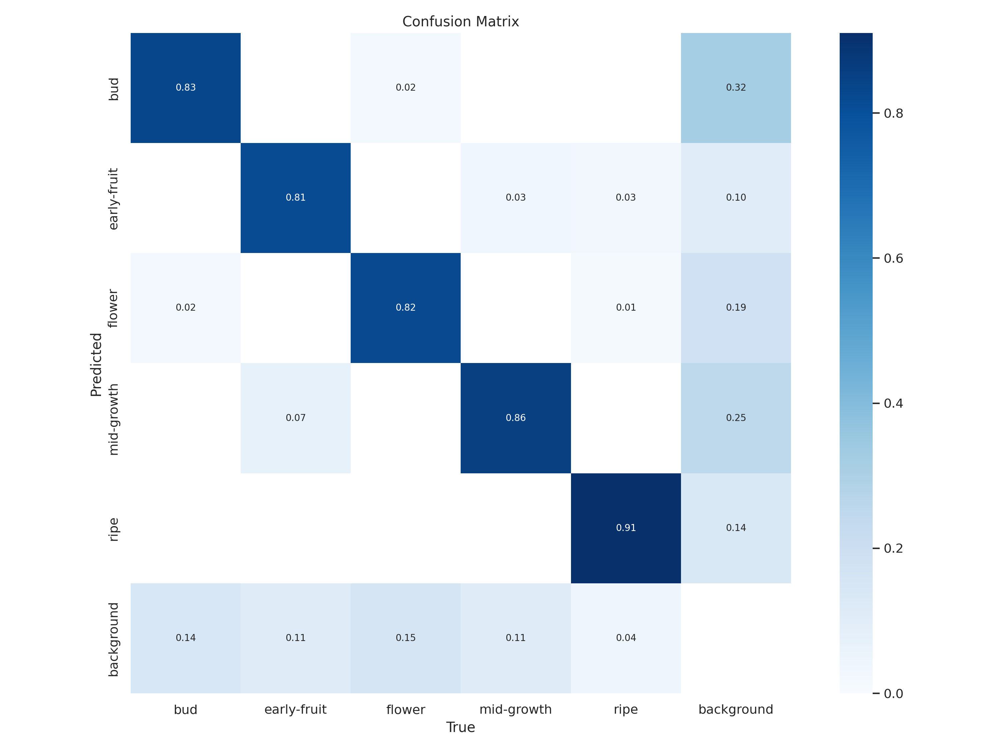

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


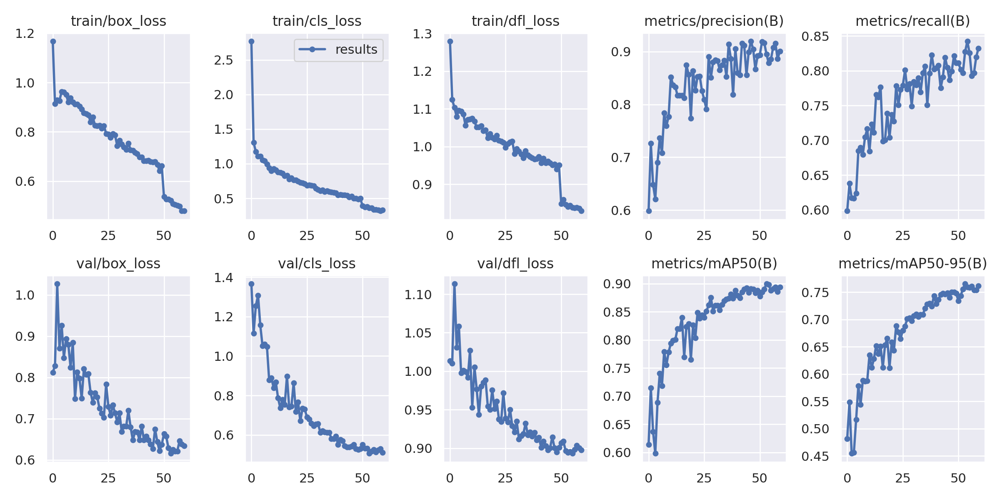

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=800)

#### IMAGES


/content


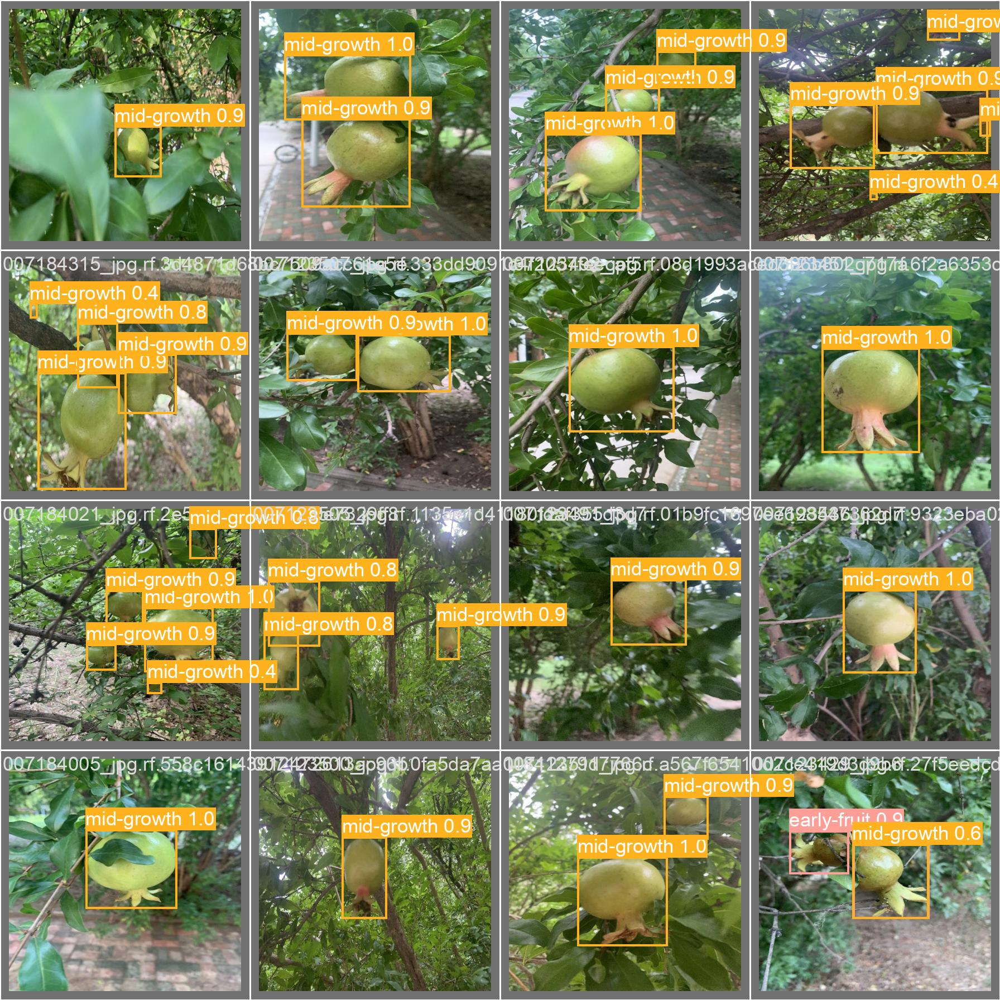

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch1_pred.jpg', width=800)

/content


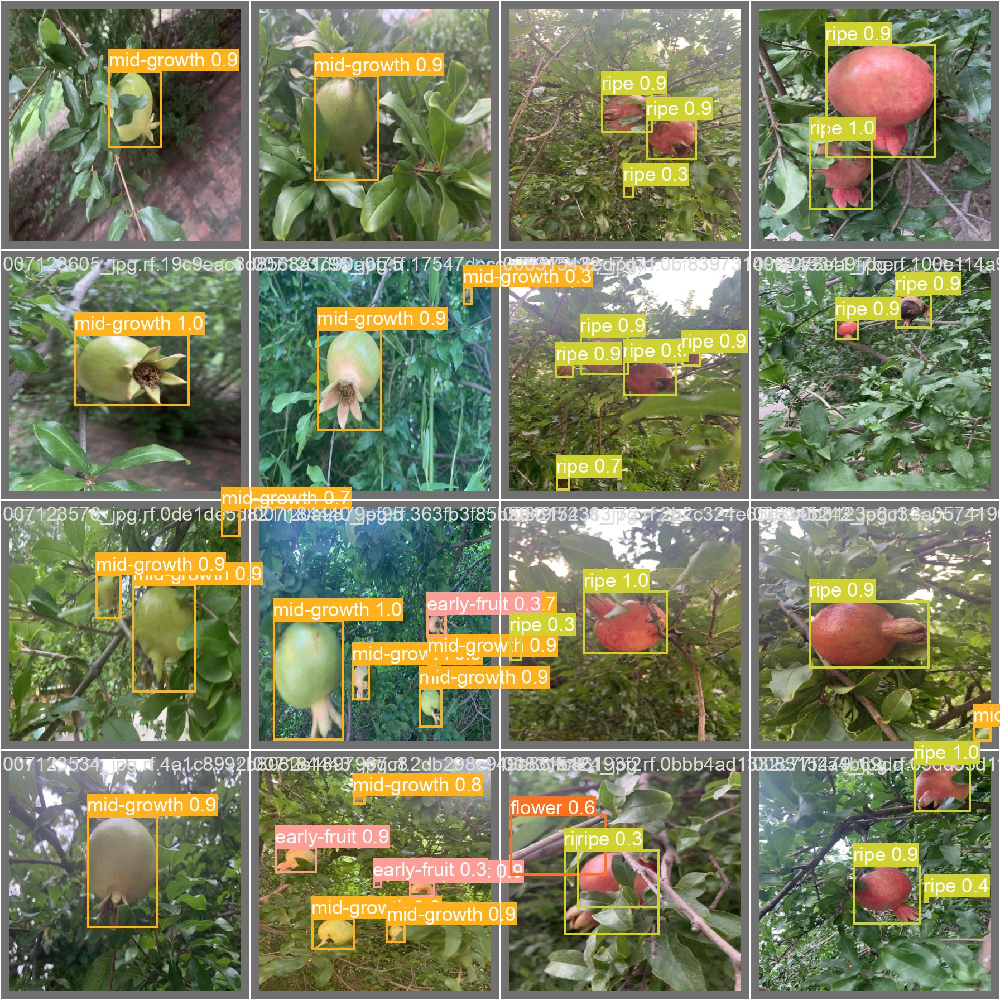

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=800)

####Sample of Train Batch

/content


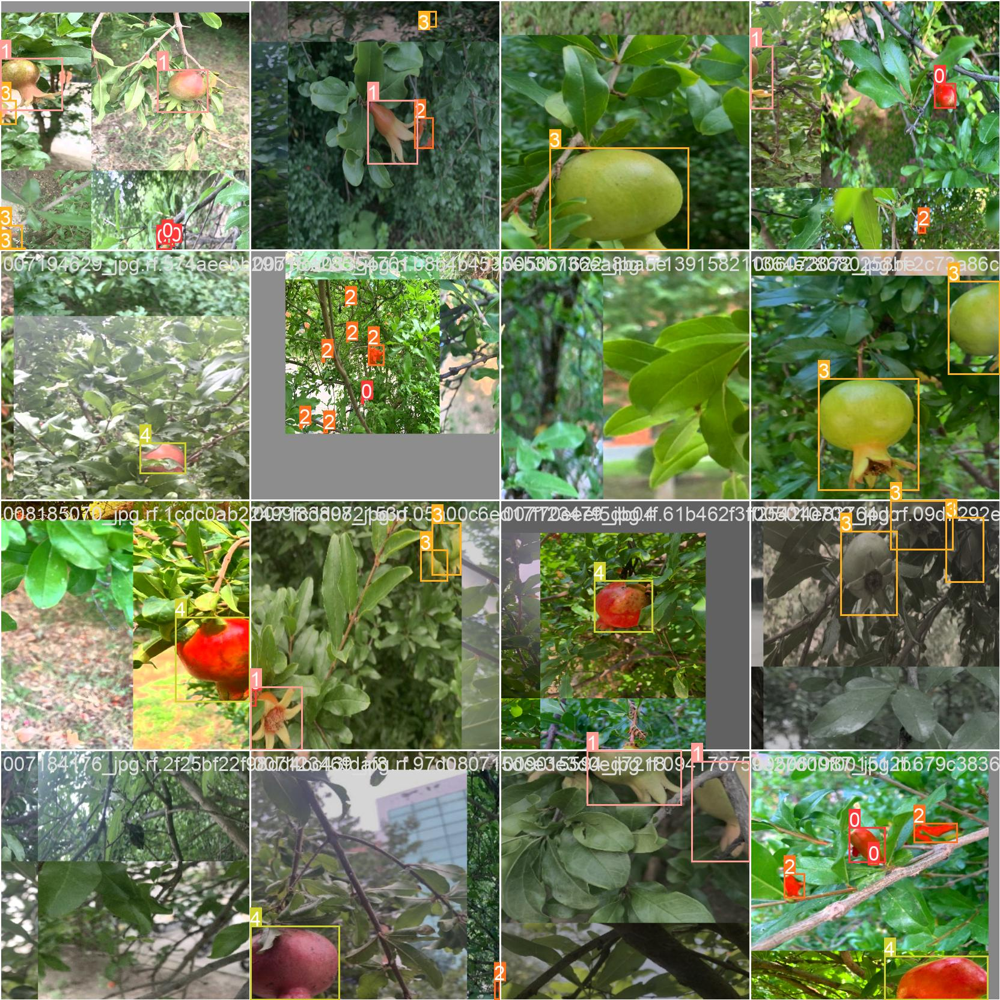

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/train_batch0.jpg', width=800)

####Fruit Predict

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
2023-12-24 08:26:08.841428: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-24 08:26:08.841501: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-24 08:26:08.843537: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-24 08:26:10.414380: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
image 1/129 /content/datasets/CSE_475-2/test/images/004250008_jp

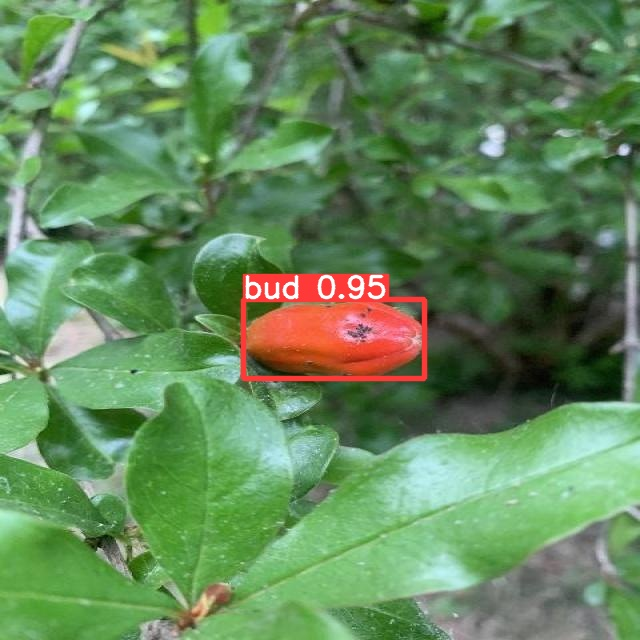

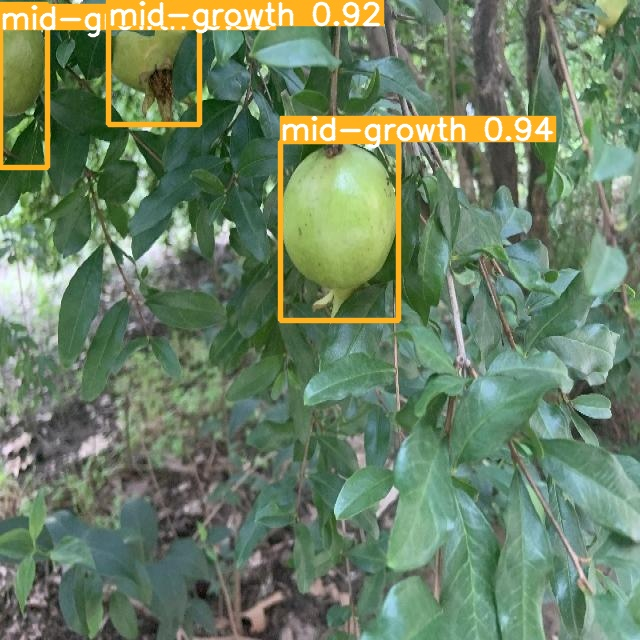

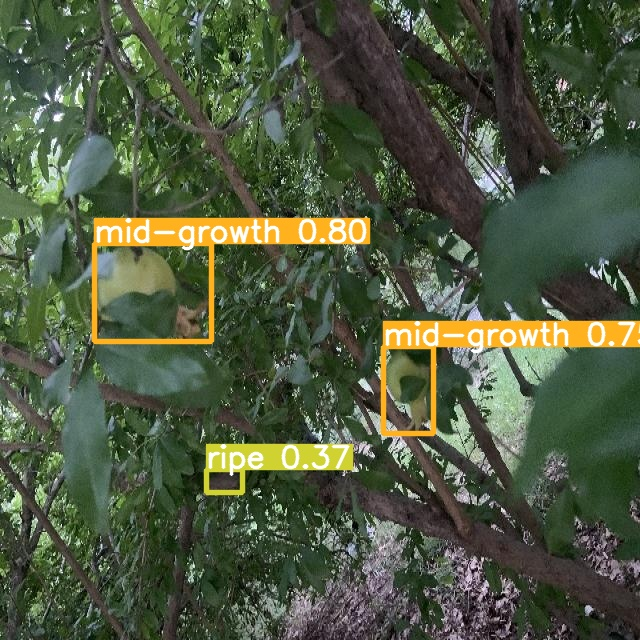

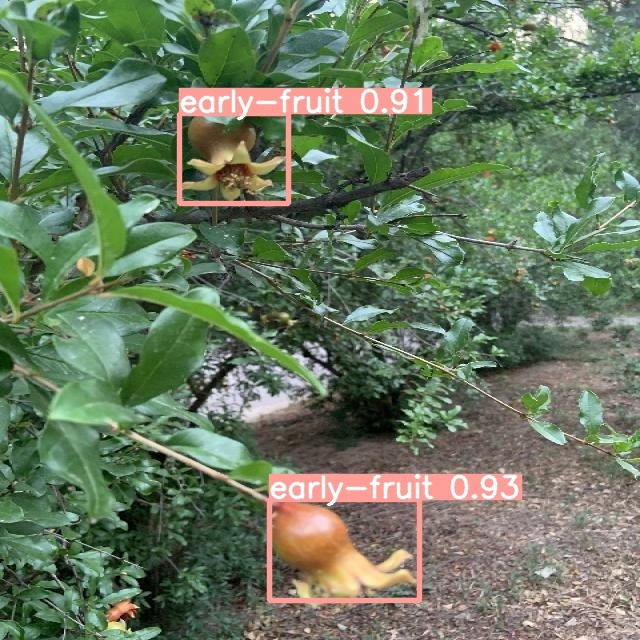

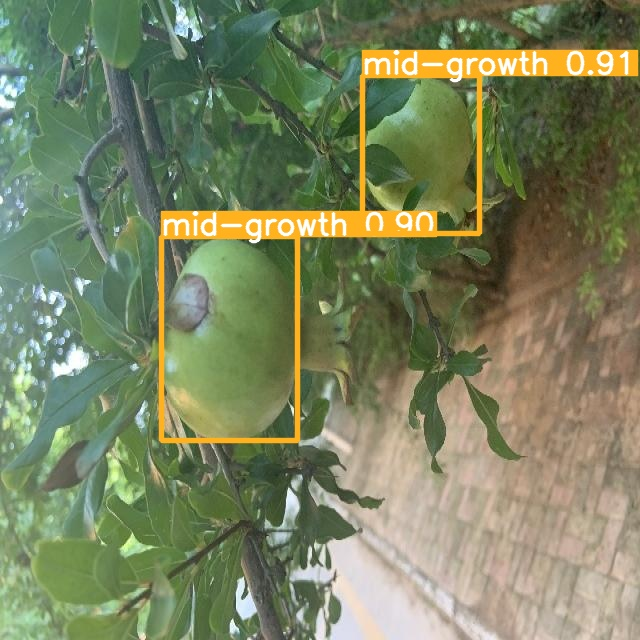

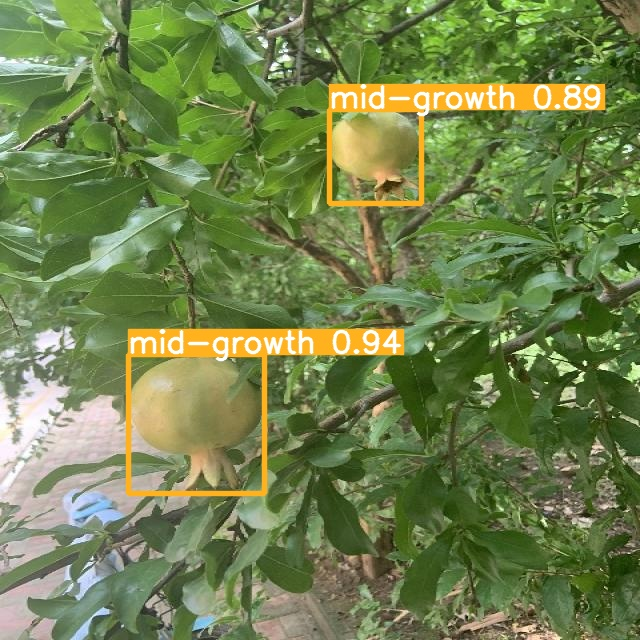

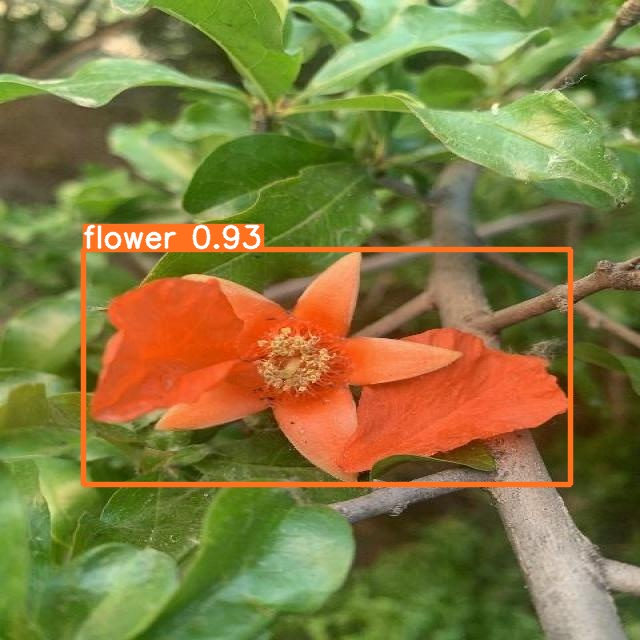

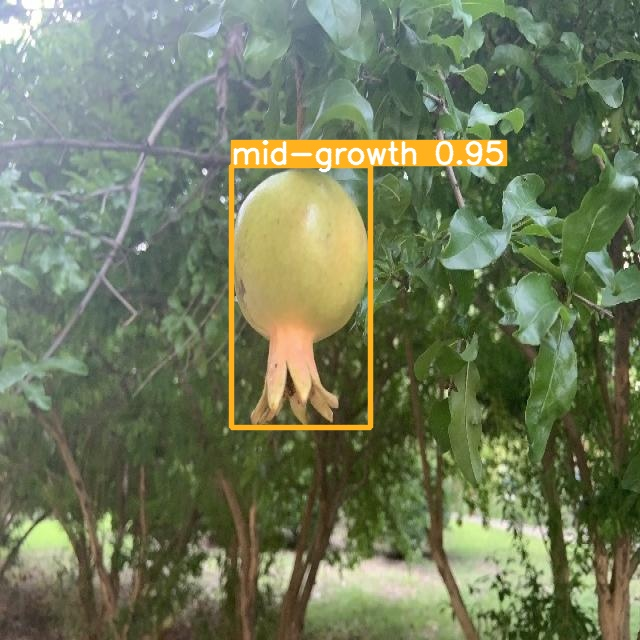

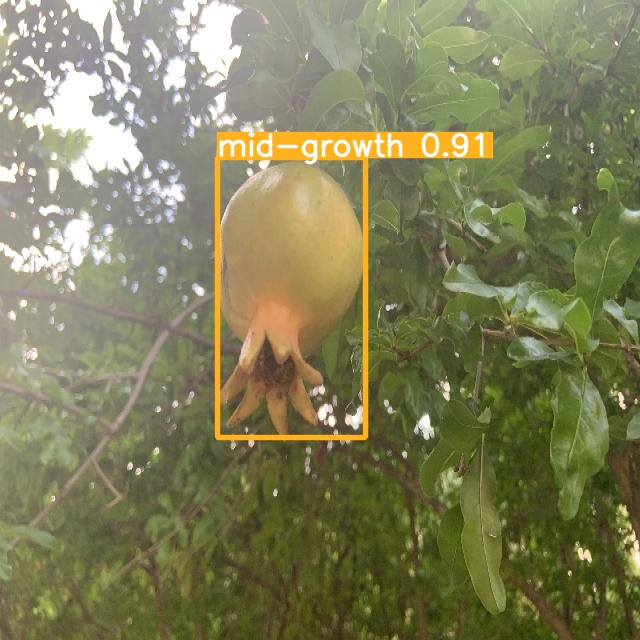

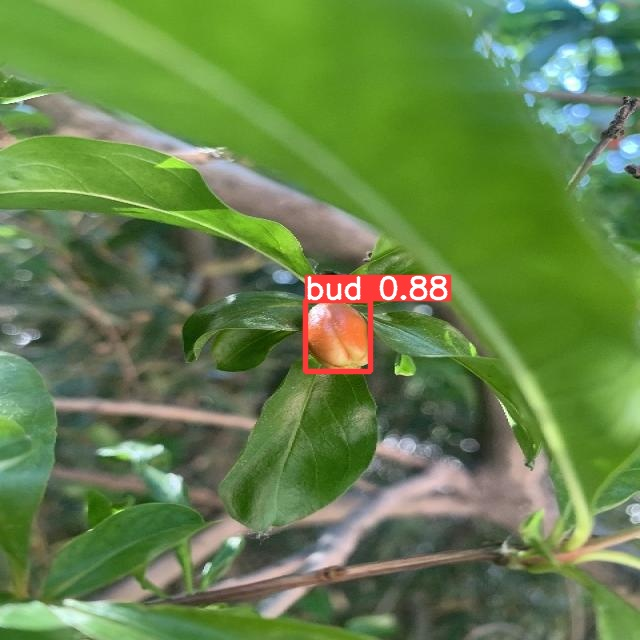

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:10]:
      display(Image(filename=image_path, width=600))
      print("\n")

## Traininig YOLOV5S Object Detection on a Custom Dataset

### Install Dependencis

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.9 MB/s eta 0:00:00
Setup complete. Using torch 2.1.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


###Download Dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sxbjhyA7urxmH0vFjhjH")
project = rf.workspace("ewu-ubd9b").project("cse_475")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to CSE_475-2 in yolov5pytorch:: 100%|██████████| 2802/2802 [00:01<00:00, 2187.93it/s]


###Explore Dataset


In [ ]:
%cat {dataset.location}/data.yaml

names:
- bud
- early-fruit
- flower
- mid-growth
- ripe
nc: 5
roboflow:
  license: CC BY 4.0
  project: cse_475
  url: https://universe.roboflow.com/ewu-ubd9b/cse_475/dataset/2
  version: 2
  workspace: ewu-ubd9b
test: ../test/images
train: CSE_475-2/train/images
val: CSE_475-2/valid/images


##YOLOV5


###Define Model Configuration and Architecture

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

###Train Custom YOLOv5 Detector

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 60 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-12-24 08:28:54.906930: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-24 08:28:54.907003: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-24 08:28:54.908513: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-24 08:28:55.975169: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/CSE_475-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noauto

### Validate the model


In [ ]:
# prompt: validate the custom model

%cd /content/yolov5
!python val.py --data {dataset.location}/data.yaml  --weights runs/train/yolov5s_results/weights/best.pt

/content/yolov5
val: data=/content/yolov5/CSE_475-2/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7257306 parameters, 0 gradients
val: Scanning /content/yolov5/CSE_475-2/valid/labels.cache... 285 images, 0 backgrounds, 0 corrupt: 100% 285/285 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 9/9 [00:09<00:00,  1.08s/it]
                   all        285        586      0.702      0.562      0.635      0.409
                   bud        285        126      0.655      0.278      0.438  

###Visulization The Result

#### Confusion Matrix

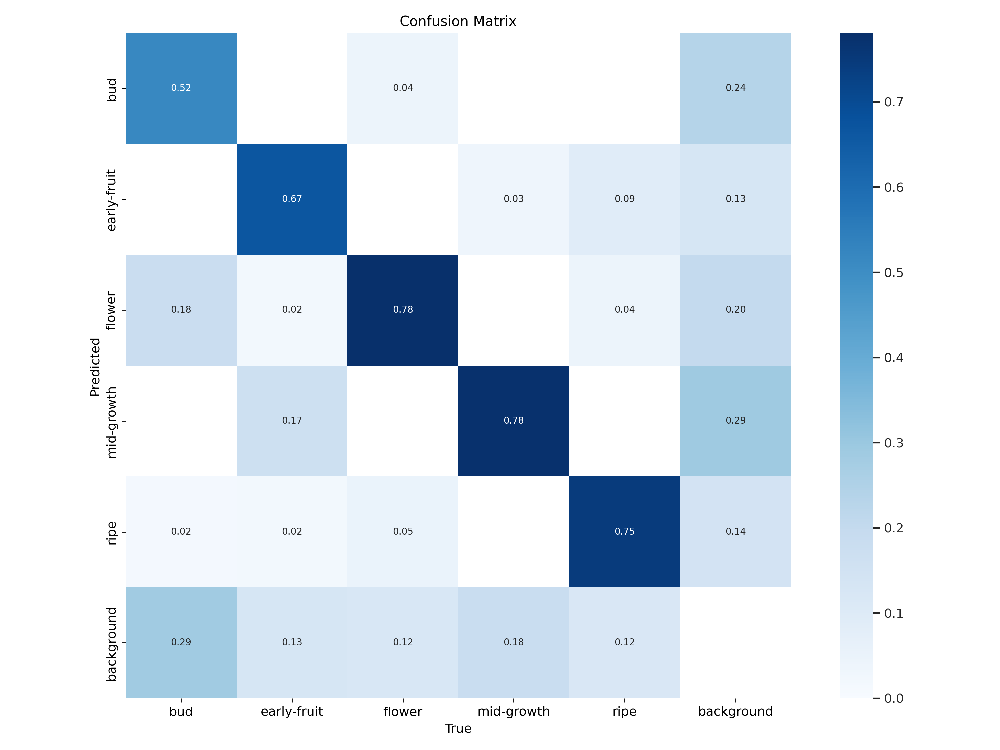

In [ ]:
Image(filename=f'/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png', width=600)

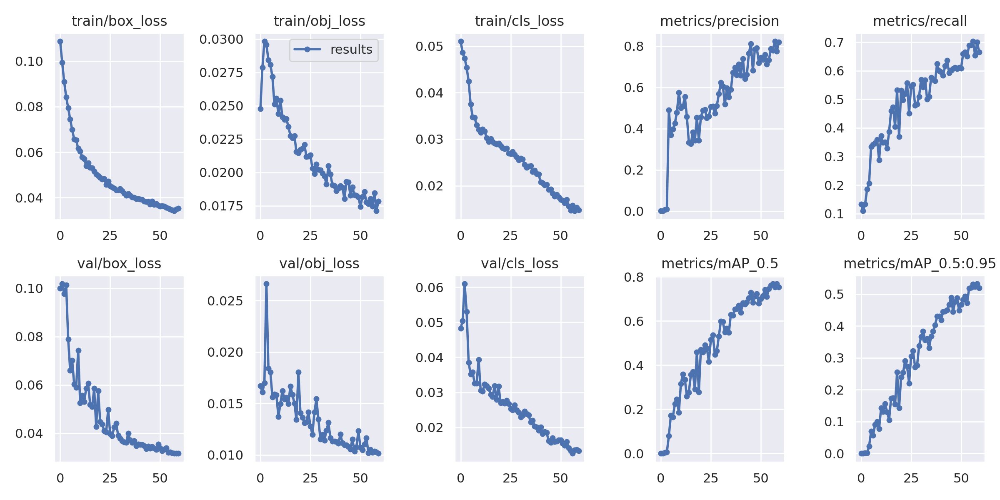

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

####IMAGES

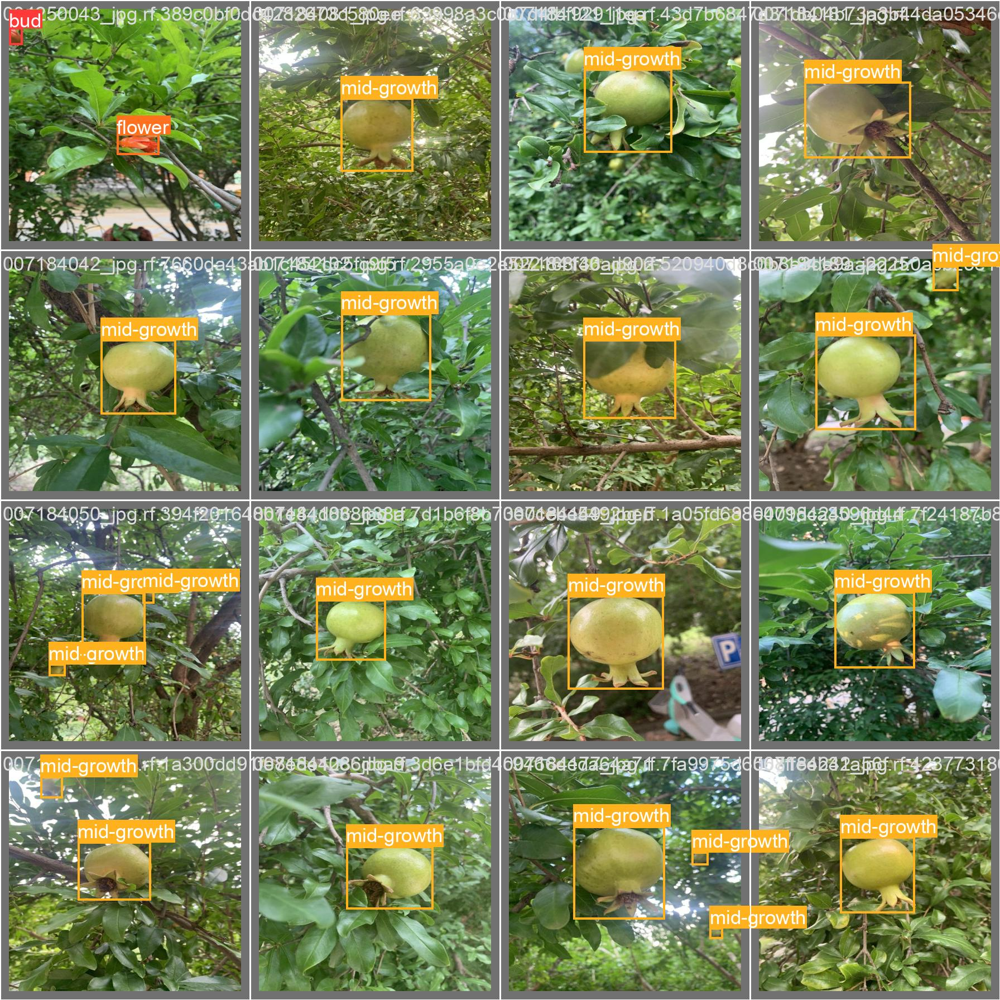

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

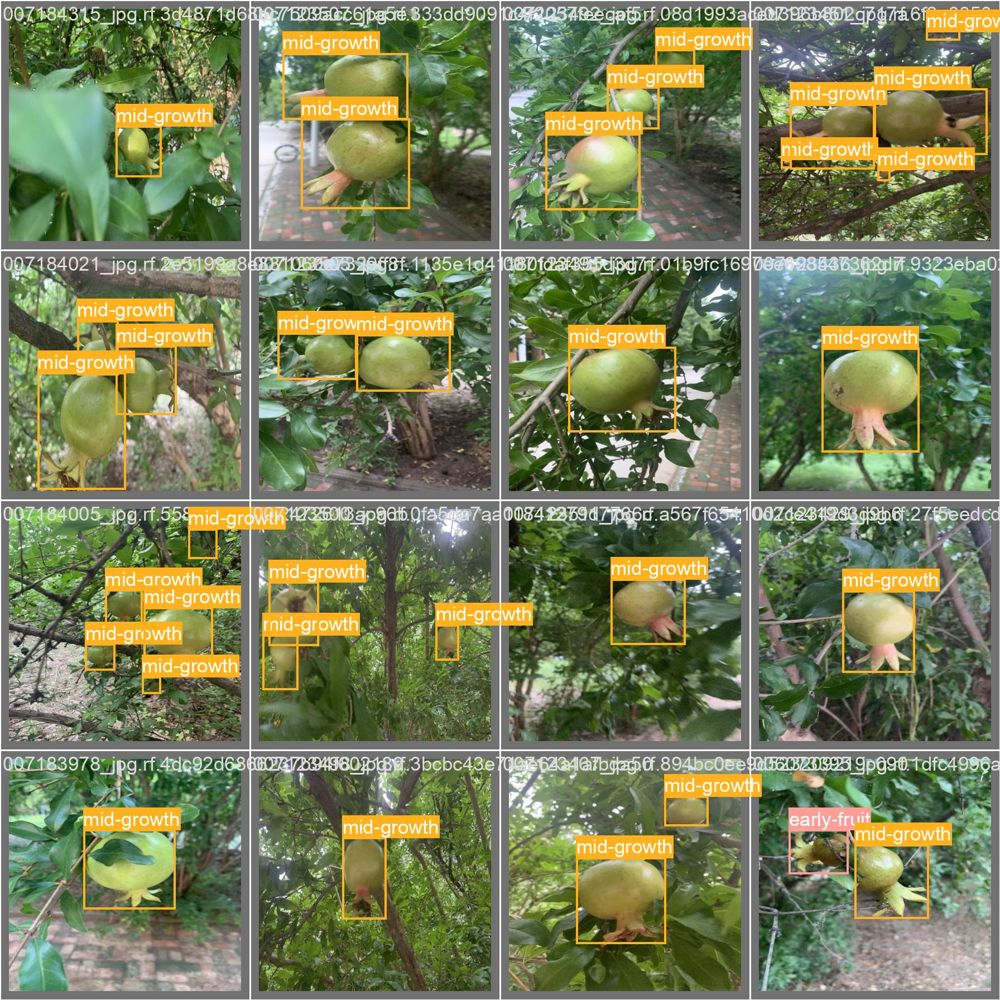

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_labels.jpg', width=900)

####Sample of Train Batch

GROUND TRUTH AUGMENTED TRAINING DATA:


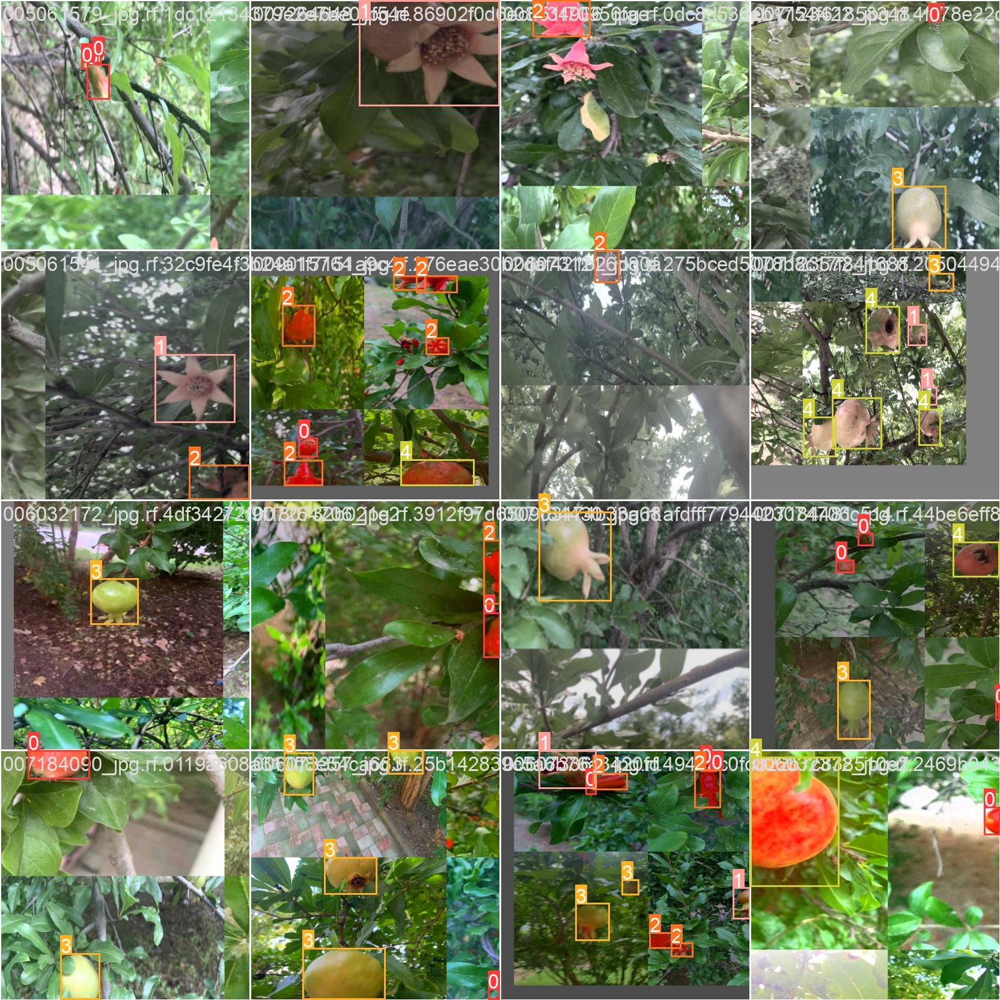

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

####Fruit Predict

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/CSE_475-2/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/CSE_475-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7257306 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/129 /content/yolov5/CSE_475-2/test/images/004250008_jpg.rf.25561c29dbf108f2ff09f5e52175045c.jpg: 416x416 1 early-fruit, 1 flower, 1 mid-growth, 7.7ms
image 2/129 /content/yolov5/CSE_475-2/test/images/004270158_jpg.rf.3df553ba61fe7e9755b06638c7f251b3.jpg: 4

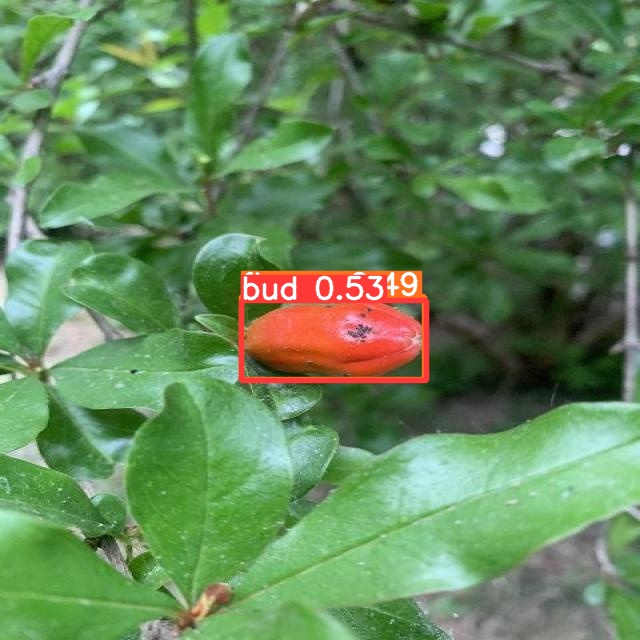

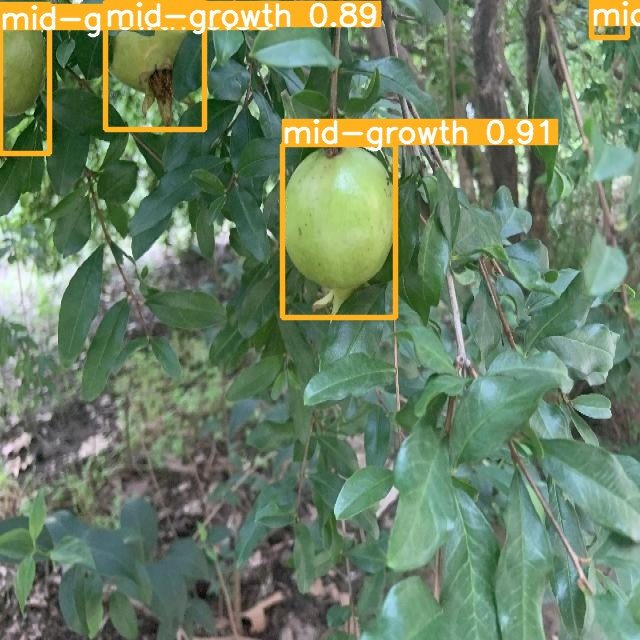

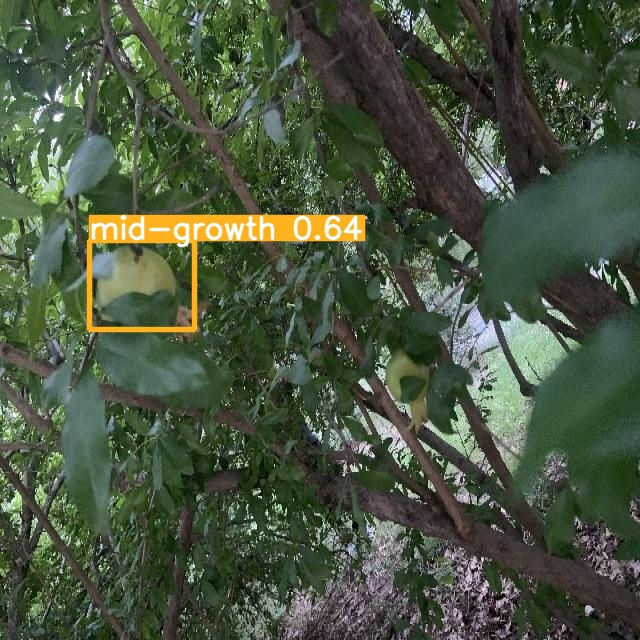

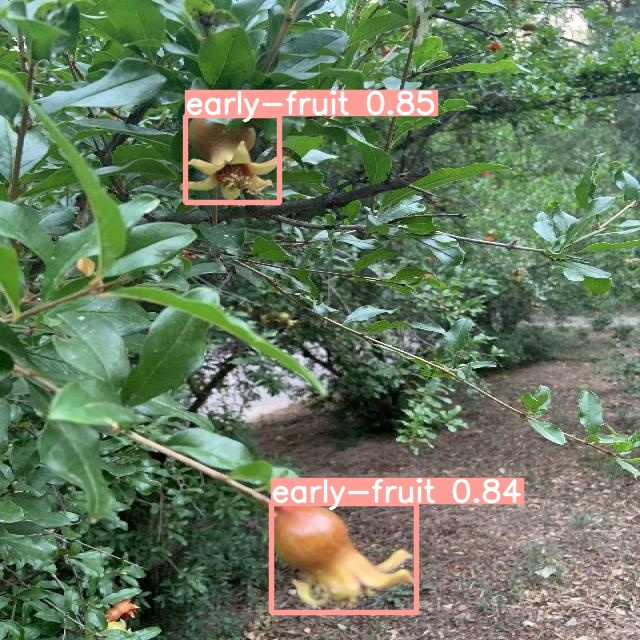

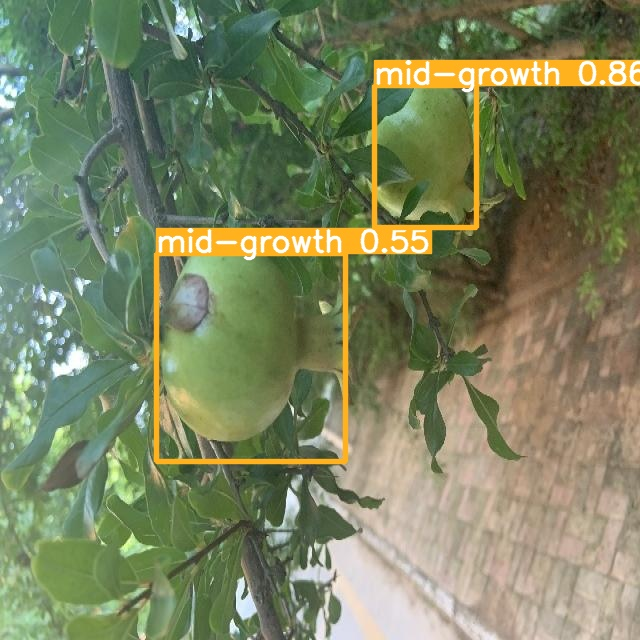

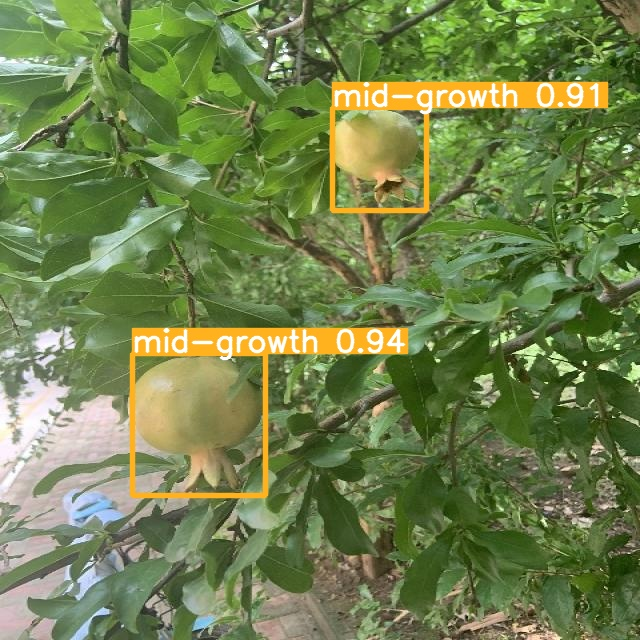

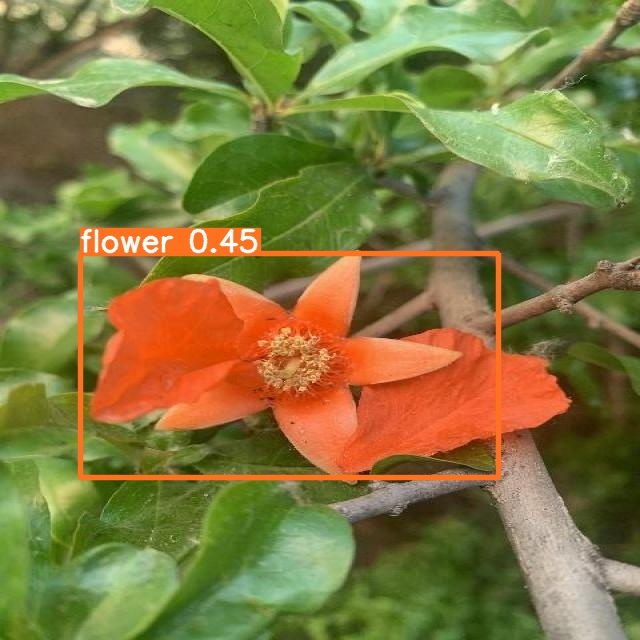

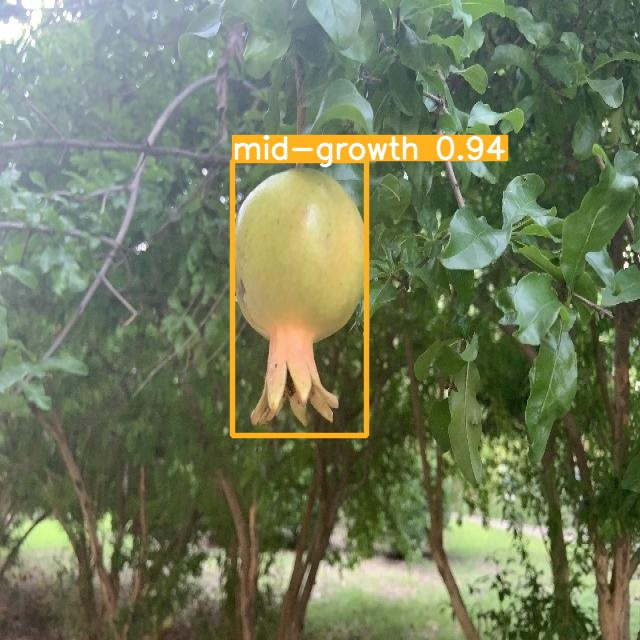

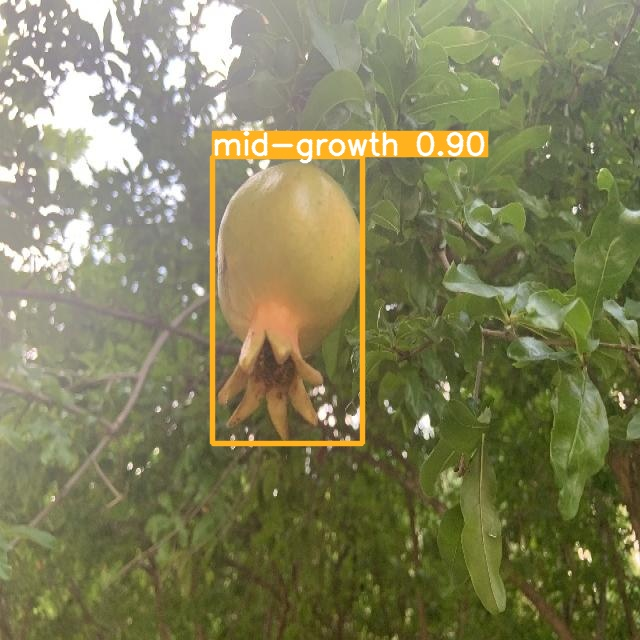

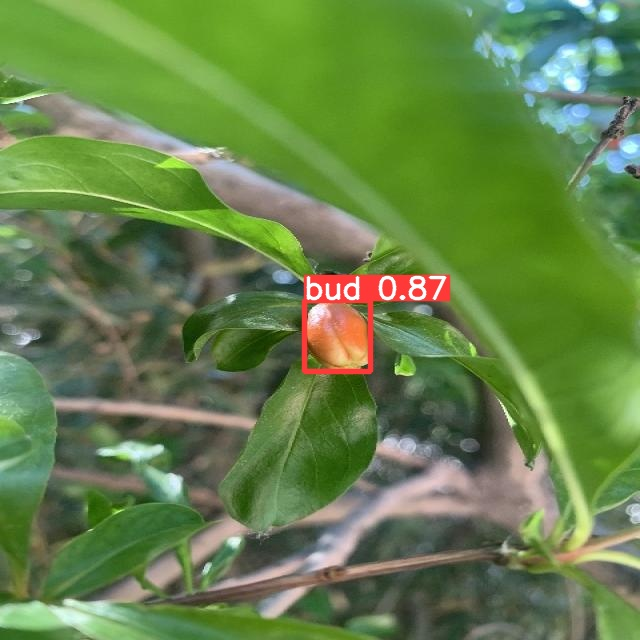

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg')[:10]: #assuming JPG
    display(Image(filename=imageName))

##Model Comparison

In [ ]:
# compare yolov8 and yolov5 precision and recall form runs
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
yolov8_results = pd.read_csv('/content/drive/MyDrive/DATA/yolo8_results.csv')


yolov8_results.head()


,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,1.16760,2.7686,1.2791,0.59844,0.59859,0.61409,0.48140,0.81207,1.3669,1.0134,0.070484,0.003280,0.003280
1,1,0.91485,1.3056,1.1241,0.72639,0.63801,0.71486,0.54870,0.82867,1.1163,1.0101,0.040375,0.006504,0.006504
2,2,0.92985,1.1744,1.1035,0.64847,0.61721,0.63713,0.45445,1.02720,1.2548,1.1136,0.010156,0.009618,0.009618
3,3,0.92650,1.1065,1.0788,0.62108,0.61673,0.59822,0.45654,0.87067,1.3083,1.0309,0.009505,0.009505,0.009505
4,4,0.96341,1.1076,1.0956,0.69021,0.62418,0.68850,0.51626,0.92646,1.1567,1.0585,0.009505,0.009505,0.009505


In [ ]:
yolov5_results = pd.read_csv('/content/drive/MyDrive/DATA/yolo5_results.csv')
yolov5_results.head()

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.108760,0.024783,0.051051,0.000553,0.13344,0.000437,0.000110,0.099963,0.016718,0.048277,0.070484,0.003280,0.003280
1,1,0.099466,0.027886,0.048659,0.000722,0.10935,0.000454,0.000110,0.101820,0.016097,0.050365,0.040375,0.006504,0.006504
2,2,0.090938,0.029841,0.047368,0.007373,0.13376,0.004947,0.001268,0.097650,0.017008,0.060955,0.010156,0.009618,0.009618
3,3,0.084297,0.029597,0.045433,0.008771,0.18487,0.005958,0.001568,0.101330,0.026630,0.053040,0.009505,0.009505,0.009505
4,4,0.079449,0.028438,0.042467,0.489460,0.20541,0.080588,0.022137,0.078945,0.018403,0.038525,0.009505,0.009505,0.009505


In [ ]:
yolov8_precision = yolov8_results['   metrics/precision(B)']
yolov8_recall = yolov8_results['      metrics/recall(B)']

In [ ]:
 yolov5_precision = yolov5_results['   metrics/precision']
 yolov5_recall = yolov5_results['      metrics/recall']

###Precision & Recall

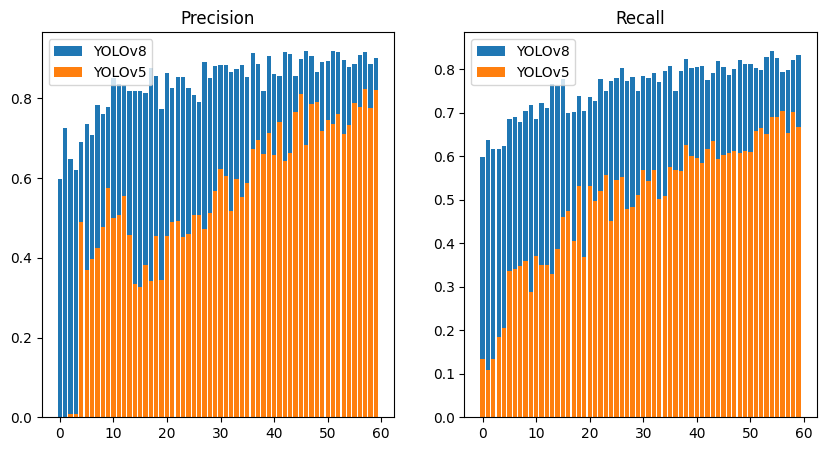

In [ ]:
# prompt: plot bar of precision and recall of yolov8 and yolov5

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].bar(yolov8_precision.index, yolov8_precision)
ax[0].bar(yolov5_precision.index, yolov5_precision)
ax[0].set_title('Precision')
ax[0].legend(['YOLOv8', 'YOLOv5'])

ax[1].bar(yolov8_recall.index, yolov8_recall)
ax[1].bar(yolov5_recall.index, yolov5_recall)
ax[1].set_title('Recall')
ax[1].legend(['YOLOv8', 'YOLOv5'])
plt.show()


###Mean Average Precision(mAP50)

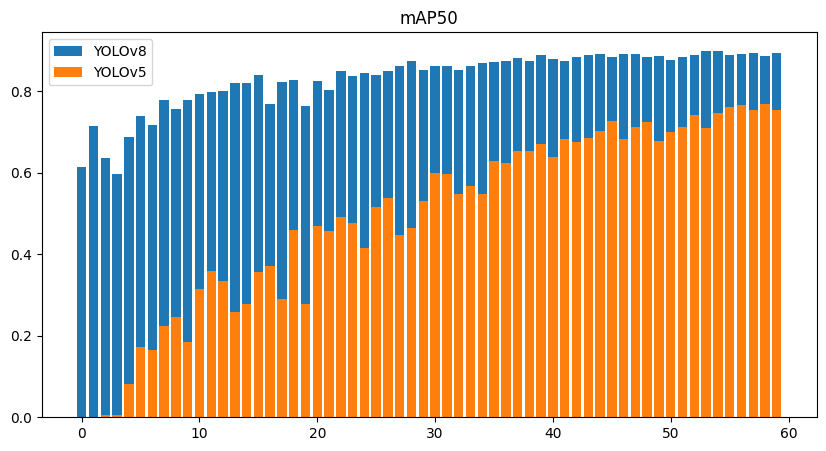

In [ ]:
# prompt: plot bar of mAP of yolov8 and yolov5

yolov8_mAP = yolov8_results['       metrics/mAP50(B)']
yolov5_mAP = yolov5_results['     metrics/mAP_0.5']

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.bar(yolov8_mAP.index, yolov8_mAP)
ax.bar(yolov5_mAP.index, yolov5_mAP)
ax.set_title('mAP50')
ax.legend(['YOLOv8', 'YOLOv5'])
plt.show()


###Train Classification Loss

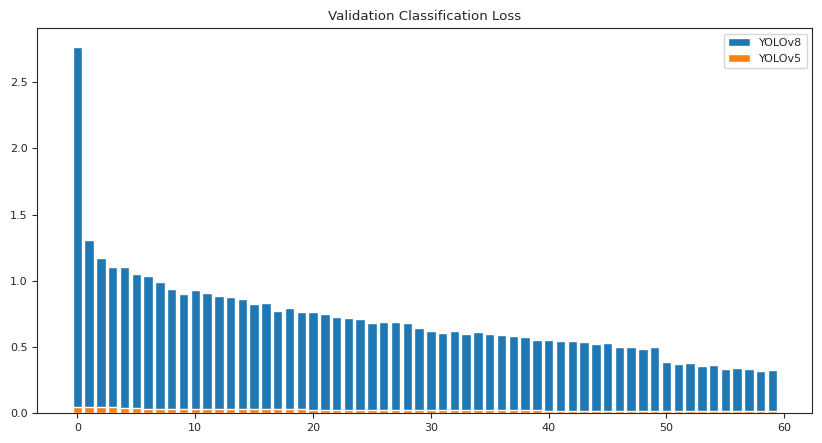

In [ ]:

yolov8_mAP = yolov8_results['         train/cls_loss']
yolov5_mAP = yolov5_results['      train/cls_loss']

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.bar(yolov8_mAP.index, yolov8_mAP)
ax.bar(yolov5_mAP.index, yolov5_mAP)
ax.set_title('Train Classification Loss')
ax.legend(['YOLOv8', 'YOLOv5'])
plt.show()


###YOLOV8 LOSS GRAPHS

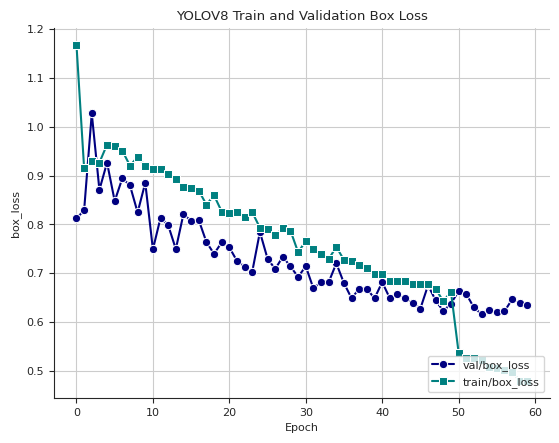

In [ ]:
sns.set_style('ticks')
plt.rcParams.update({'font.size': 8})

# Create a Seaborn line plot with different markers for each product
sns.lineplot(x='                  epoch', y='           val/box_loss', data=yolov8_results, marker='o', color='navy', label='val/box_loss')
sns.lineplot(x='                  epoch', y='         train/box_loss', data=yolov8_results, marker='s', color='teal', label='train/box_loss')


# Set plot title and axes labels
plt.title('YOLOV8 Train and Validation Box Loss')
plt.xlabel('Epoch')
plt.ylabel('box_loss')

# Add a legend
plt.legend(loc='lower right')

# Add a grid
plt.grid(True)

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()

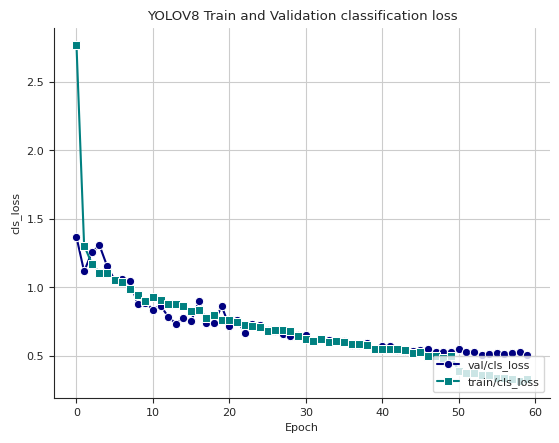

In [ ]:
sns.set_style('ticks')
plt.rcParams.update({'font.size': 8})

# Create a Seaborn line plot with different markers for each product
sns.lineplot(x='                  epoch', y='           val/cls_loss', data=yolov8_results, marker='o', color='navy', label='val/cls_loss')
sns.lineplot(x='                  epoch', y='         train/cls_loss', data=yolov8_results, marker='s', color='teal', label='train/cls_loss')


# Set plot title and axes labels
plt.title('YOLOV8 Train and Validation classification loss')
plt.xlabel('Epoch')
plt.ylabel('cls_loss')

# Add a legend
plt.legend(loc='lower right')

# Add a grid
plt.grid(True)

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()

###YOLOV5 LOSS GRAPHS

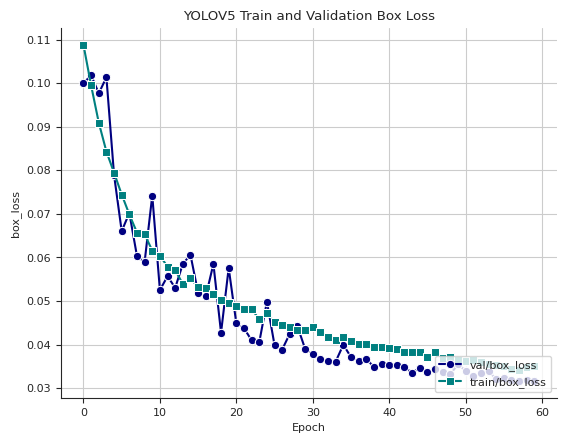

In [ ]:
sns.set_style('ticks')
plt.rcParams.update({'font.size': 8})

# Create a Seaborn line plot with different markers for each product
sns.lineplot(x='               epoch', y='        val/box_loss', data=yolov5_results, marker='o', color='navy', label='val/box_loss')
sns.lineplot(x='               epoch', y='      train/box_loss', data=yolov5_results, marker='s', color='teal', label='train/box_loss')


# Set plot title and axes labels
plt.title('YOLOV5 Train and Validation Box Loss')
plt.xlabel('Epoch')
plt.ylabel('box_loss')

# Add a legend
plt.legend(loc='lower right')

# Add a grid
plt.grid(True)

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()

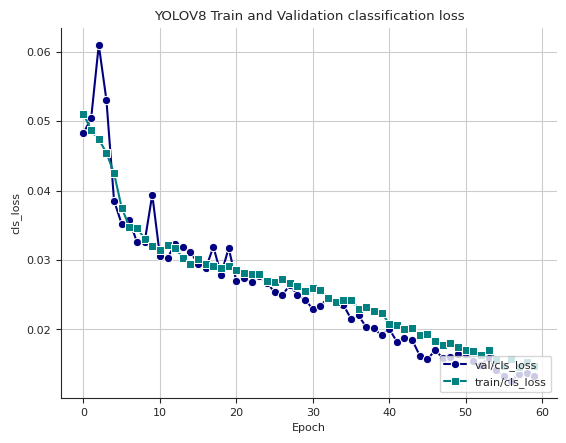

In [ ]:
sns.set_style('ticks')
plt.rcParams.update({'font.size': 8})

# Create a Seaborn line plot with different markers for each product
sns.lineplot(x='               epoch', y='        val/cls_loss', data=yolov5_results, marker='o', color='navy', label='val/cls_loss')
sns.lineplot(x='               epoch', y='      train/cls_loss', data=yolov5_results, marker='s', color='teal', label='train/cls_loss')


# Set plot title and axes labels
plt.title('YOLOV8 Train and Validation classification loss')
plt.xlabel('Epoch')
plt.ylabel('cls_loss')

# Add a legend
plt.legend(loc='lower right')

# Add a grid
plt.grid(True)

# Remove the top and right spines
sns.despine()

# Show the plot
plt.show()